<a href="https://colab.research.google.com/github/rafaelgoncalvesml/1TIAPGML/blob/main/checkpoints/%5Bcheckpoint_aula_1end_2start%5D_01_10082026_Diagnostico_Regularizacao_Redes_Neurais_DL_AG_SKLT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🎓 Diagnóstico, Regularização e Estabilização de Redes Neurais
**Disciplina:** REDES NEURAIS ARTIFICIAIS, DEEP LEARNING E ALGORITMOS GENÉTICOS

**Curso:** Tecnólogo em Inteligência Artificial

---

## 🎯 Objetivos de Aprendizagem

Ao final desta aula prática, você será capaz de:
1. **Construir** um pipeline para treinamento robusto de **redes neurais profundas**.
2. **Diagnosticar** e **corrigir** problemas de **underfitting** e **overfitting**.
3. Empregar técnicas de **regularização**, **normalização** e **controle adaptativo** do treinamento.
4. **Traduzir** métricas técnicas para métricas de negócio.

---




## 🛠️ Etapa 1


In [1]:
#@title Setup
import os
import random
import warnings

# 1. Definir SEED base
SEED = 42 #@param {type:"integer"}

# 2. Configurar variáveis relacionadas ao determinismode ambiente ANTES
# de importar o TensorFlow
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filtrar warnings
warnings.filterwarnings('ignore')

# 3. Definir seeds do Python e NumPy
random.seed(SEED)
np.random.seed(SEED)

# 4. Importar e configurar TensorFlow
import tensorflow as tf

# set_random_seed inicializa
tf.keras.utils.set_random_seed(SEED)

# Forçar determinismo nas operações da GPU e CPU
try:
    tf.config.experimental.enable_op_determinism()
    print("Determinismo no TensorFlow ativado com sucesso!")
except Exception as e:
    print(f"Aviso ao ativar determinismo: {e}")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, auc, roc_auc_score
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import layers, models, callbacks, regularizers

# Configurações visuais
plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')

print(f"Versão do TensorFlow: {tf.__version__}")
print("Dispositivos GPU disponíveis:", tf.config.list_physical_devices('GPU'))

Determinismo no TensorFlow ativado com sucesso!
Versão do TensorFlow: 2.20.0
Dispositivos GPU disponíveis: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
#@title Carregando dataset de transações de cartão de crédito
# Download do dataset de transações de cartão de crédito
file_path = tf.keras.utils.get_file(
    'creditcard.csv',
    'https://storage.googleapis.com/download.tensorflow.org/data/creditcard.csv'
)

df = pd.read_csv(file_path)
print(f"Dimensões do Dataset: {df.shape[0]} linhas x {df.shape[1]} colunas")
df.head()


150828752/150828752 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Dimensões do Dataset: 284807 linhas x 31 colunas


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


### Entendendo as Variáveis Anônimas

| Variável no Dataset | Conceito / Atributo Mapeado do Mundo Real | Relevância para o Modelo de IA |
| :--- | :--- | :--- |
| `Time` | Tempo em segundos decorrido entre a transação e a primeira do dataset | Captura padrões temporais (ex: madrugada vs horário comercial) |
| `Amount` | Valor monetário da transação financeira | Permite identificar desvios do ticket médio do cliente |
| `V1` | **Distância Geográfica da Última Transação:** Desvio entre a posição GPS atual e a habitual | Fraudes frequentemente ocorrem em locais distantes do perfil |
| `V2` | **Frequência Transacional Recente:** Número de tentativas nos últimos 10 minutos | Ataques de *card testing* (testes em massa de cartões roubados) |
| `V3` | **Score de Risco do Estabelecimento Comercial / Merchant Category Code (MCC)** | Transações em estabelecimentos de alto risco (apostas, moedas virtuais) |
| `V4` | **Incompatibilidade de Dispositivo e IP:** Mismatch entre SO do celular, IP e país de origem | Indica uso de emuladores, proxies ou VPNs maliciosas |
| `V5` | **Desvio do Ticket Médio Pessoal:** Razão entre valor atual e média histórica de 90 dias | Transações pontuais atipicamente altas acendem alerta |
| `V6` | **Velocidade de Deslocamento Impossível:** Distância física dividida pelo tempo decorrido | Se o usuário comprou em SP e 5 min depois em NY, é fraude física |
| `V7` | **Flag de Transação Noturna ou Atípica:** Indicador binário derivado do horário habitual | Compras em horários onde o usuário habitualmente está dormindo |
| `V8` | **Histórico de Estornos e Contestações Previas (Chargeback History)** | Cartões com histórico recorrente de problemas ou bloqueios prévios |
| `V9` a `V28` | Demais componentes ortogonais (Score de crédito, idade da conta, canal, etc.) | Capturam variações residuais de menor variância nos dados |
| `Class` | **Alvo / Label:** `0` = Transação Legítima | `1` = Transação Fraudulenta |

---


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,...,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00
mean,94813.86,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,...,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,88.35,0.00
std,47488.15,1.96,1.65,1.52,1.42,1.38,1.33,1.24,1.19,1.10,...,0.73,0.73,0.62,0.61,0.52,0.48,0.40,0.33,250.12,0.04
min,0.00,-56.41,-72.72,-48.33,-5.68,-113.74,-26.16,-43.56,-73.22,-13.43,...,-34.83,-10.93,-44.81,-2.84,-10.30,-2.60,-22.57,-15.43,0.00,0.00
25%,54201.50,-0.92,-0.60,-0.89,-0.85,-0.69,-0.77,-0.55,-0.21,-0.64,...,-0.23,-0.54,-0.16,-0.35,-0.32,-0.33,-0.07,-0.05,5.60,0.00
50%,84692.00,0.02,0.07,0.18,-0.02,-0.05,-0.27,0.04,0.02,-0.05,...,-0.03,0.01,-0.01,0.04,0.02,-0.05,0.00,0.01,22.00,0.00
75%,139320.50,1.32,0.80,1.03,0.74,0.61,0.40,0.57,0.33,0.60,...,0.19,0.53,0.15,0.44,0.35,0.24,0.09,0.08,77.16,0.00
max,172792.00,2.45,22.06,9.38,16.88,34.80,73.30,120.59,20.01,15.59,...,27.20,10.50,22.53,4.58,7.52,3.52,31.61,33.85,25691.16,1.00


Transações Legítimas (Classe 0): 284,315 (99.827%)
Transações Fraudulentas (Classe 1): 492 (0.173%)


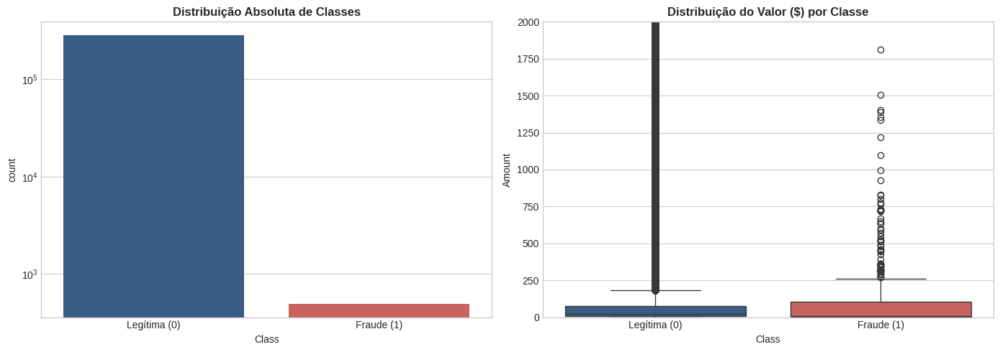

In [3]:
#@title Análise Exploratória de Dados (EDA)
display(df.describe().round(2))

counts = df['Class'].value_counts()
pct_legit = (counts[0] / len(df)) * 100
pct_fraud = (counts[1] / len(df)) * 100

print(f"Transações Legítimas (Classe 0): {counts[0]:,} ({pct_legit:.3f}%)")
print(f"Transações Fraudulentas (Classe 1): {counts[1]:,} ({pct_fraud:.3f}%)")

# Visualização Gráfica
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

sns.countplot(x='Class', data=df, ax=ax[0], palette=['#2b5c8f', '#d9534f'])
ax[0].set_title("Distribuição Absoluta de Classes", fontsize=12, fontweight='bold')
ax[0].set_yscale('log') # Escala logarítmica para evidenciar a classe minoritária
ax[0].set_xticklabels(['Legítima (0)', 'Fraude (1)'])

sns.boxplot(x='Class', y='Amount', data=df, ax=ax[1], palette=['#2b5c8f', '#d9534f'])
ax[1].set_title("Distribuição do Valor ($) por Classe", fontsize=12, fontweight='bold')
ax[1].set_ylim(0, 2000)
ax[1].set_xticklabels(['Legítima (0)', 'Fraude (1)'])

plt.tight_layout()
plt.show()


#### Relembrando o Boxplot

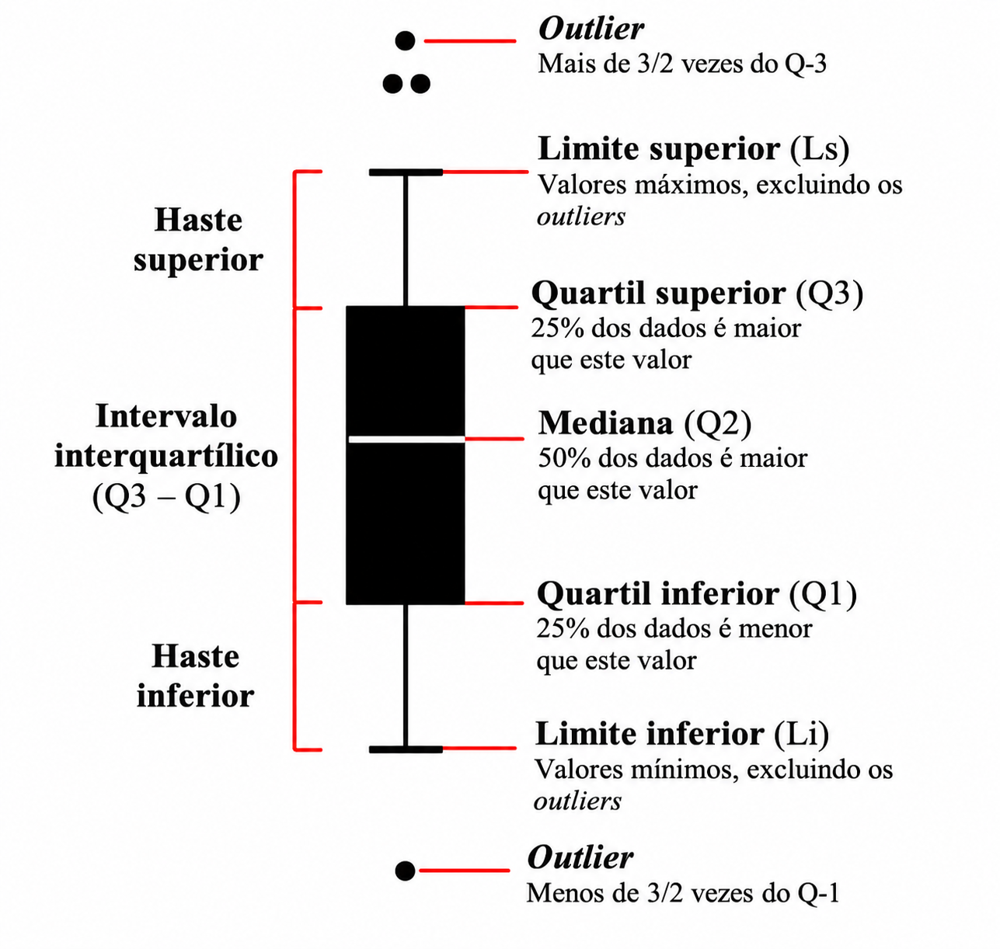

### Pré-processamento: Padronização das variáveis 'Amount' e 'Time'

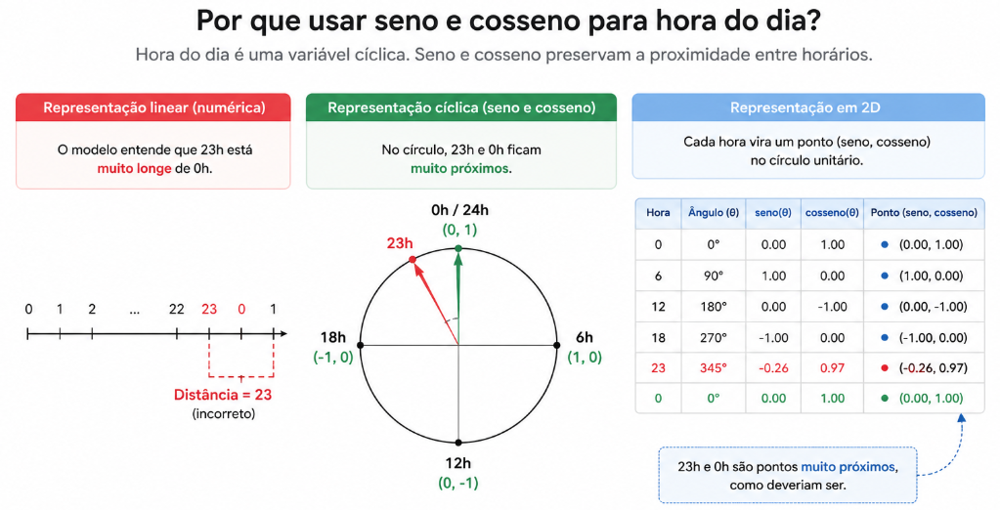

In [4]:
hour = (df["Time"] / 3600) % 24

df["hour_sin"] = np.sin(2 * np.pi * hour / 24)
df["hour_cos"] = np.cos(2 * np.pi * hour / 24)
df.describe().round(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,hour_sin,hour_cos
count,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,...,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00
mean,94813.86,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,...,0.00,0.00,0.00,0.00,-0.00,-0.00,88.35,0.00,-0.27,-0.14
std,47488.15,1.96,1.65,1.52,1.42,1.38,1.33,1.24,1.19,1.10,...,0.62,0.61,0.52,0.48,0.40,0.33,250.12,0.04,0.63,0.72
min,0.00,-56.41,-72.72,-48.33,-5.68,-113.74,-26.16,-43.56,-73.22,-13.43,...,-44.81,-2.84,-10.30,-2.60,-22.57,-15.43,0.00,0.00,-1.00,-1.00
25%,54201.50,-0.92,-0.60,-0.89,-0.85,-0.69,-0.77,-0.55,-0.21,-0.64,...,-0.16,-0.35,-0.32,-0.33,-0.07,-0.05,5.60,0.00,-0.84,-0.84
50%,84692.00,0.02,0.07,0.18,-0.02,-0.05,-0.27,0.04,0.02,-0.05,...,-0.01,0.04,0.02,-0.05,0.00,0.01,22.00,0.00,-0.44,-0.31
75%,139320.50,1.32,0.80,1.03,0.74,0.61,0.40,0.57,0.33,0.60,...,0.15,0.44,0.35,0.24,0.09,0.08,77.16,0.00,0.25,0.60
max,172792.00,2.45,22.06,9.38,16.88,34.80,73.30,120.59,20.01,15.59,...,22.53,4.58,7.52,3.52,31.61,33.85,25691.16,1.00,1.00,1.00


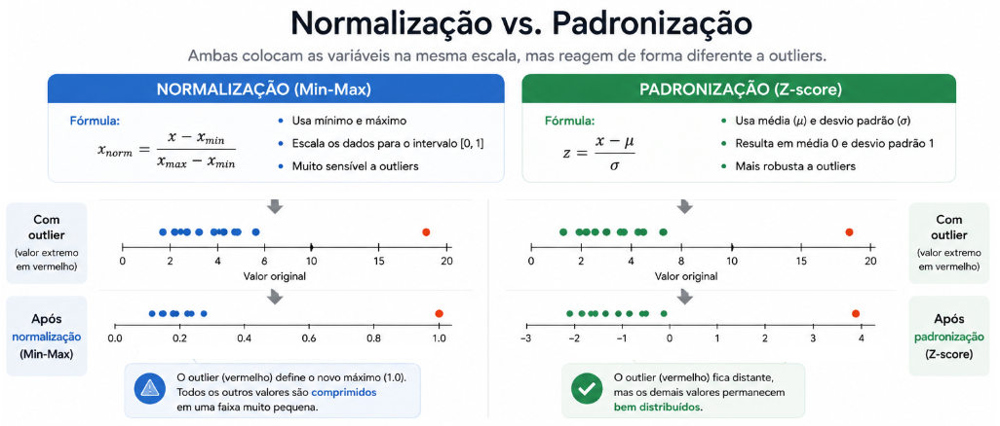

In [5]:
scaler = StandardScaler()
df['scaled_amount'] = scaler.fit_transform(df[['Amount']])
df.describe().round(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V24,V25,V26,V27,V28,Amount,Class,hour_sin,hour_cos,scaled_amount
count,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,...,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00
mean,94813.86,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,...,0.00,0.00,0.00,-0.00,-0.00,88.35,0.00,-0.27,-0.14,0.00
std,47488.15,1.96,1.65,1.52,1.42,1.38,1.33,1.24,1.19,1.10,...,0.61,0.52,0.48,0.40,0.33,250.12,0.04,0.63,0.72,1.00
min,0.00,-56.41,-72.72,-48.33,-5.68,-113.74,-26.16,-43.56,-73.22,-13.43,...,-2.84,-10.30,-2.60,-22.57,-15.43,0.00,0.00,-1.00,-1.00,-0.35
25%,54201.50,-0.92,-0.60,-0.89,-0.85,-0.69,-0.77,-0.55,-0.21,-0.64,...,-0.35,-0.32,-0.33,-0.07,-0.05,5.60,0.00,-0.84,-0.84,-0.33
50%,84692.00,0.02,0.07,0.18,-0.02,-0.05,-0.27,0.04,0.02,-0.05,...,0.04,0.02,-0.05,0.00,0.01,22.00,0.00,-0.44,-0.31,-0.27
75%,139320.50,1.32,0.80,1.03,0.74,0.61,0.40,0.57,0.33,0.60,...,0.44,0.35,0.24,0.09,0.08,77.16,0.00,0.25,0.60,-0.04
max,172792.00,2.45,22.06,9.38,16.88,34.80,73.30,120.59,20.01,15.59,...,4.58,7.52,3.52,31.61,33.85,25691.16,1.00,1.00,1.00,102.36


In [6]:
# Remoção das colunas originais não escaladas
X = df.drop(columns=['Time', 'Amount', 'Class'])
y = df['Class'].values

# Divisão em Treino (70%), Validação (15%) e Teste (15%) com Estratificação e Seed Garantida
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.15, random_state=SEED, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_full, test_size=0.1765, random_state=SEED, stratify=y_train_full
)

print(f"Conjunto de Treino:    {X_train.shape[0]} amostras | Fraudes: {sum(y_train)}")
print(f"Conjunto de Validação: {X_val.shape[0]} amostras | Fraudes: {sum(y_val)}")
print(f"Conjunto de Teste:     {X_test.shape[0]} amostras | Fraudes: {sum(y_test)}")


Conjunto de Treino:    199356 amostras | Fraudes: 344
Conjunto de Validação: 42729 amostras | Fraudes: 74
Conjunto de Teste:     42722 amostras | Fraudes: 74


### Cálculo dos Pesos de Classe (Class Weights) para Compensar o Desbalanceamento

In [7]:
class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)

class_weights = {0: float(class_weights_array[0]), 1: float(class_weights_array[1])}

print("Pesos calculados para cada classe:")
print(f" - Classe 0 (Legítima): {class_weights[0]:.4f}")
print(f" - Classe 1 (Fraude):   {class_weights[1]:.4f}")


Pesos calculados para cada classe:
 - Classe 0 (Legítima): 0.5009
 - Classe 1 (Fraude):   289.7616


## 🛠️ Etapa 2: Modelo de Rede Neural Baseline

# Layers

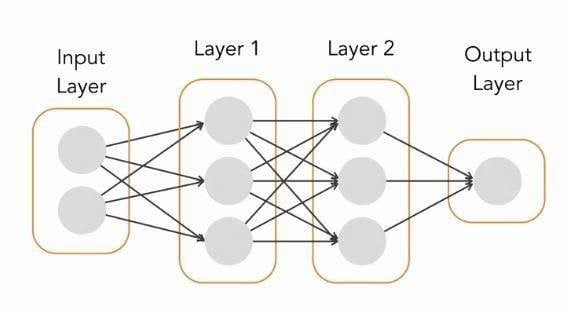

**layers.Input:** É a porta de entrada dos dados na rede.

Possui neurônios? NÃO.

Possui pesos ($W$) ou viés ($b$) para treinar? NÃO.

Para que serve então? Serve unicamente para definir a dimensão (formato) das informações que vão entrar. Se o seu dataset de transações de cartão tem $30$ colunas (features), o input_dim será $30$. O Keras usa essa linha para saber o tamanho das matrizes de peso que precisará criar nas camadas seguintes.

**layers.Dense**: É uma camada totalmente conectada (Fully Connected Layer).

Possui neurônios? SIM. O número indicado no primeiro parâmetro (ex: $256$, $128$, $1$) é a quantidade de neurônios daquela camada.

Possui pesos para treinar? SIM. Cada neurônio dessa camada se conecta a TODOS os neurônios da camada anterior.

O que ela calcula internamente? Cada neurônio faz uma combinação linear dos dados recebidos:$$z = (w_1 \cdot x_1 + w_2 \cdot x_2 + \dots + w_n \cdot x_n) + b$$Onde $W$ são os pesos (pesos de importância) e $b$ é o viés (bias).

# Função de Ativação

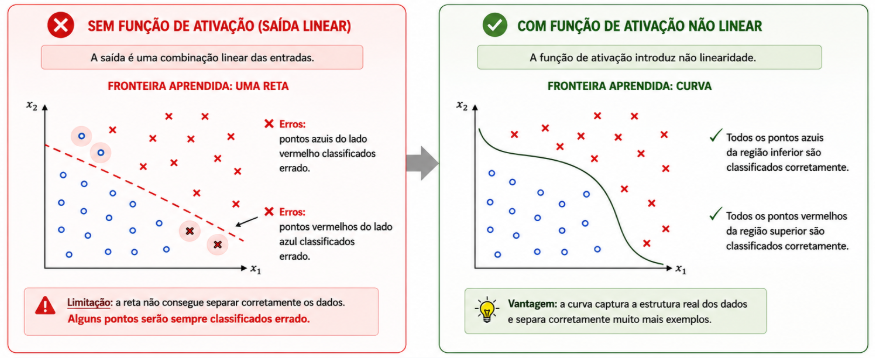

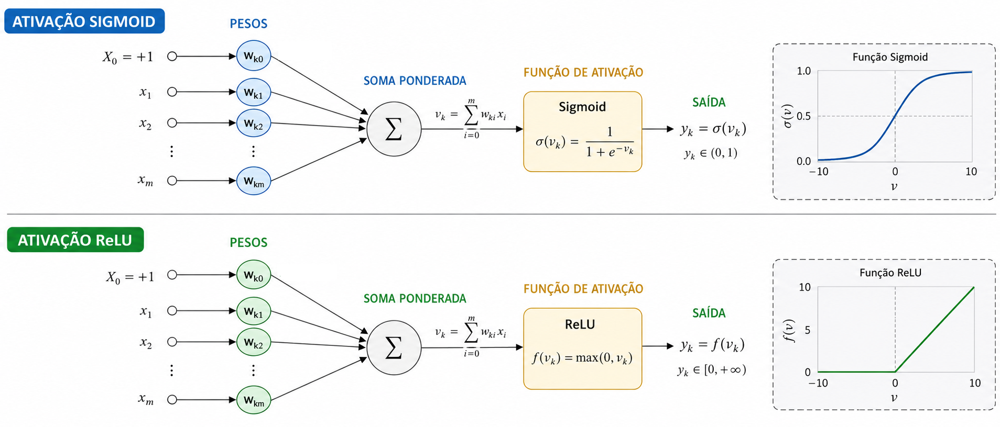

Se a camada Dense faz apenas contas lineares ($z = Wx + b$), o que acontece se empilharmos 10 camadas Dense sem função de ativação? A rede inteira se comporta matematicamente como uma única grande função linear! Ela seria incapaz de aprender padrões complexos, curvas e fronteiras de decisão não-lineares.A função de ativação é aplicada logo após o cálculo $z = Wx + b$ para introduzir a não-linearidade.

# Treinamento

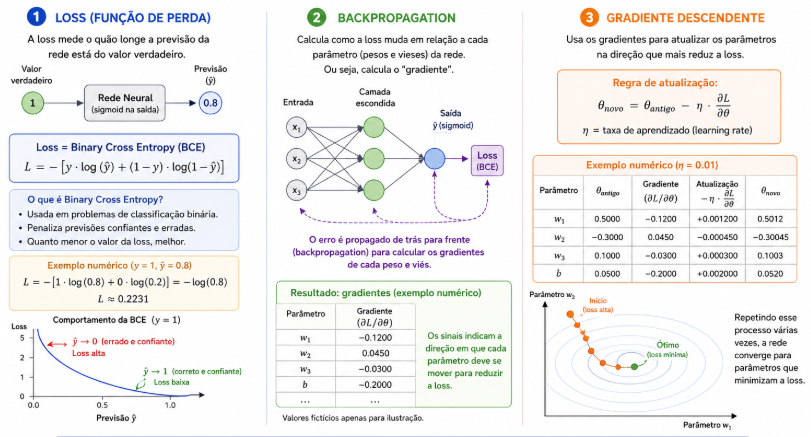

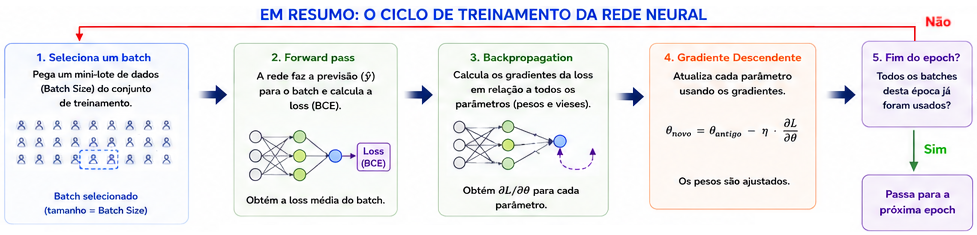

**Por que usamos ReLU nas camadas intermediárias (ocultas)?**
- Computacionalmente muito rápida: Requer apenas verificar se o valor é maior que zero, sem calcular exponenciais complexas.
- Combate o Desaparecimento do Gradiente (Vanishing Gradient): Em redes profundas com ativações antigas (como Sigmoid), o gradiente vai ficando próximo de zero à medida que retropropagamos o erro, fazendo a rede parar de aprender. A ReLU tem derivada constante ($=1$) para valores positivos, permitindo que o aprendizado flua bem pelas camadas profundas.
- Ativação Esparsa: Como zera qualquer entrada negativa, ela desativa parte dos neurônios a cada entrada, tornando a representação na rede mais eficiente.

**Por que usamos Sigmoid na camada final deste modelo?**

Nosso problema é de classificação binária (transação 0: Legítima | 1: Fraude). Como a saída da Sigmoid está entre $0$ e $1$, podemos interpretá-la diretamente como uma PROBABILIDADE:
- Saída $= 0.03 \rightarrow 3\%$ de chance de ser fraude (prevê classe $0$).
- Saída $= 0.92 \rightarrow 92\%$ de chance de ser fraude (prevê classe $1$).

In [8]:
# Construção do Modelo Baseline
def build_baseline_model(input_dim):
    # Resetar seed para reprodutibilidade no momento de inicializar pesos
    tf.keras.backend.clear_session()
    tf.random.set_seed(SEED)

    ### O Sequential (Sequencial) é o modelo mais simples do Keras.
    # Ele funciona como uma esteira de montagem em linha reta:
    # os dados entram na primeira camada, passam sequencialmente para a segunda, depois para a terceira, e assim por diante, até chegarem à camada final de saída.
    # TODO Crie aqui um modelo Sequencial
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])

    return model

model_baseline = build_baseline_model(X_train.shape[1]) #.shape => (linhas, colunas)
model_baseline.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         4,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,465 (56.50 KB)

 Trainable params: 14,465 (56.50 KB)

 Non-trainable params: 0 (0.00 B)

In [9]:
# Compilação do Modelo Baseline

# TODO Adicione as métricas que vão ser plotadas durante o treinamento
metrics_list = [
    tf.keras.metrics.BinaryAccuracy(name='accuracy'),
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall'),
    tf.keras.metrics.AUC(name='pr_auc', curve='PR')
]

# TODO Configure o compile com o optmizer, learning rate, loss e métricas a
# serem listadas durante o treinamento
model_baseline.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.007),
    loss='binary_crossentropy',
    metrics=metrics_list
)

# TODO Inicialize o treinamento passando os datasets de treinamento e validação
# e configurando a quantidade de épocas e batch size
history_baseline = model_baseline.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=2048
)


Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.9897 - loss: 0.0258 - pr_auc: 0.2239 - precision: 0.0635 - recall: 0.3605 - val_accuracy: 0.9994 - val_loss: 0.0032 - val_pr_auc: 0.7429 - val_precision: 0.8333 - val_recall: 0.8108
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9994 - loss: 0.0030 - pr_auc: 0.7722 - precision: 0.8519 - recall: 0.8023 - val_accuracy: 0.9994 - val_loss: 0.0030 - val_pr_auc: 0.7670 - val_precision: 0.8333 - val_recall: 0.8108
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9995 - loss: 0.0026 - pr_auc: 0.7999 - precision: 0.8687 - recall: 0.8081 - val_accuracy: 0.9994 - val_loss: 0.0029 - val_pr_auc: 0.7994 - val_precision: 0.8333 - val_recall: 0.8108
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9995 - loss: 0.0024 - pr_auc: 0.8347 - precision: 0.8797 - recall: 0.8081 - val_accuracy: 0.9994 - val_loss: 0.0029 - val_pr_auc: 0.8198 - val_precision: 0.8310 - val_recall: 0.7973
Epoch 5/50
98/

### Relembrando algumas métricas

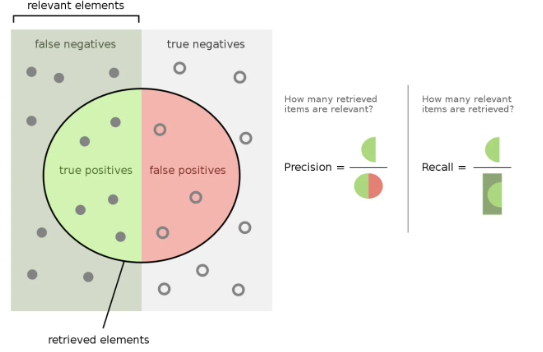

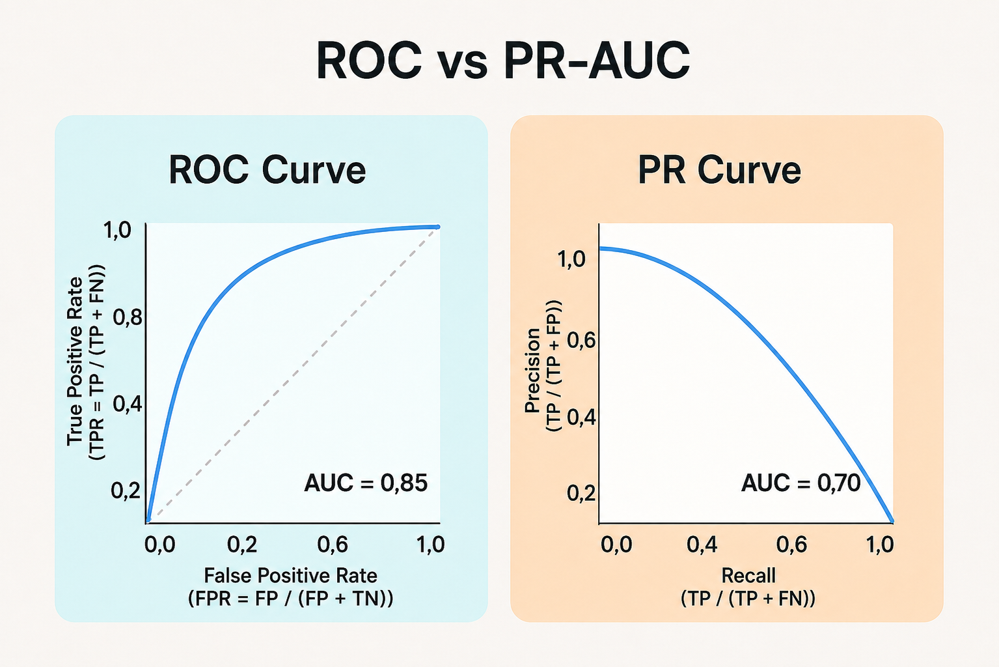

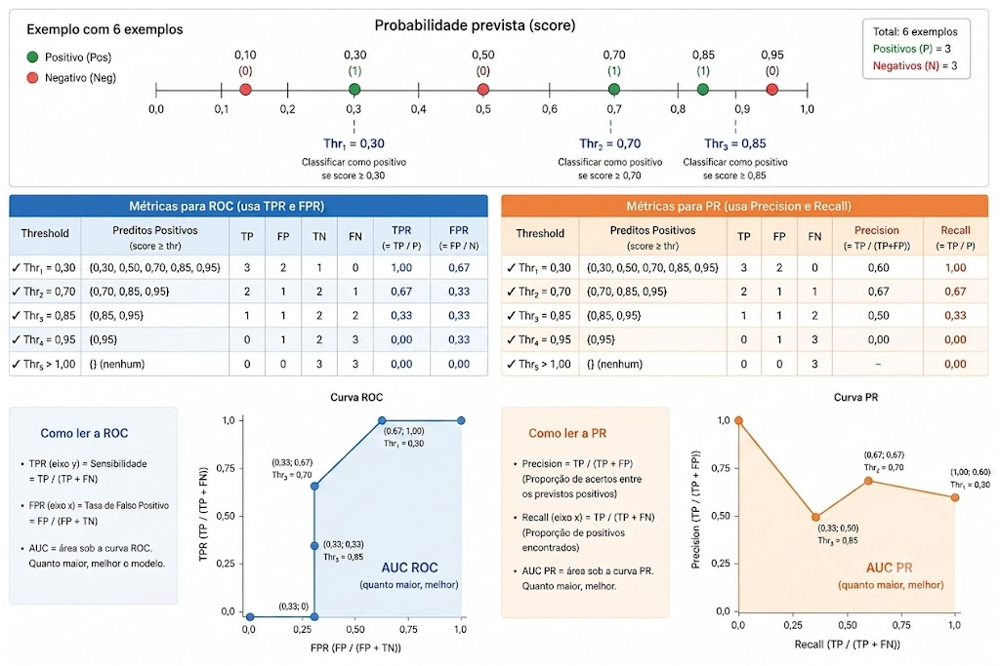

### Função para Plotagem de Curvas de Aprendizado

In [10]:
def plot_learning_curves(history, title_prefix="Modelo"):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    epochs = range(1, len(history.history['loss']) + 1)

    # Gráfico 1: Binary Crossentropy Loss
    axes[0].plot(epochs, history.history['loss'], 'o-', label='Treino', color='#1f77b4', linewidth=2)
    axes[0].plot(epochs, history.history['val_loss'], 's--', label='Validação', color='#d62728', linewidth=2)
    axes[0].set_title(f'{title_prefix}: Loss (Treino vs Validação)', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Época')
    axes[0].set_ylabel('Loss (Binary Crossentropy)')
    axes[0].legend(fontsize=11)

    # Gráfico 2: Precision-Recall AUC (PR-AUC)
    axes[1].plot(epochs, history.history['pr_auc'], 'o-', label='Treino', color='#1f77b4', linewidth=2)
    axes[1].plot(epochs, history.history['val_pr_auc'], 's--', label='Validação', color='#2ca02c', linewidth=2)
    axes[1].set_title(f'{title_prefix}: Precision-Recall AUC', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Época')
    axes[1].set_ylabel('PR-AUC Score')
    axes[1].legend(fontsize=11)

    plt.tight_layout()
    plt.show()


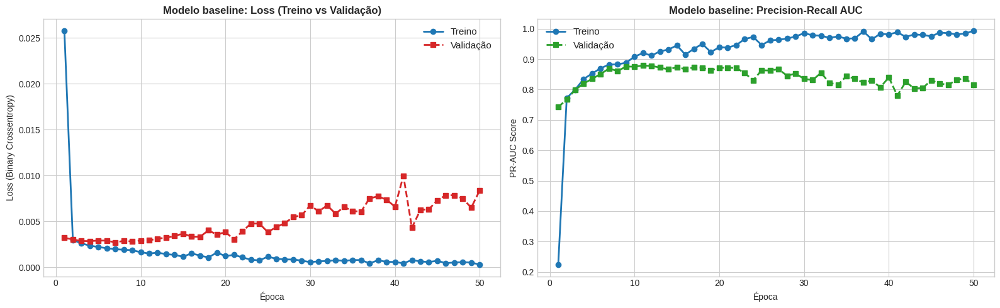

In [11]:
# TODO Executar plotagem do Baseline passando o histórico e o prefixo do título dos gráficos
plot_learning_curves(history_baseline, "Modelo baseline")

## 🛠️ Etapa 3: Refatoração com Batch Normalization, Dropout e Callbacks

### Estratégia de Engenharia da Arquitetura de Redes Neurais:
1. **BatchNormalization:** Inserida antes da ativação Não-Linear (`ReLU`).
2. **Dropout (0.3):** Adicionado após cada camada oculta.
3. **Class Weights:** Aplicados no treinamento.
4. **Callbacks Nativos:** `EarlyStopping` e `ReduceLROnPlateau`.
5. **Binary Focal Cross Entropy:** trocar BCE por uma loss focada nos exemplos mais difíceis.


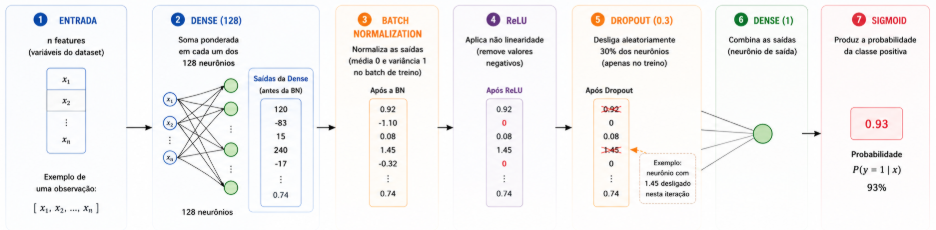

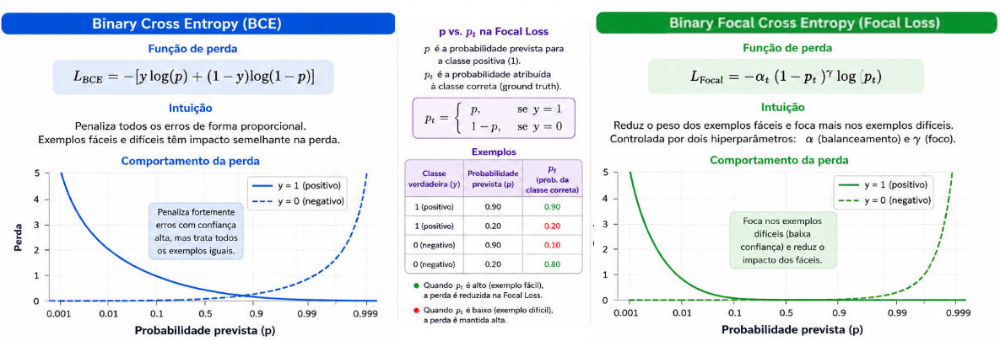

In [18]:
# Construção da Arquitetura Refatorada e Regularizada
def build_regularized_model(input_dim, dropout_rate=0.3):
    tf.keras.backend.clear_session()
    tf.random.set_seed(SEED)

    # TODO Crie aqui um modelo Sequencial com BatchNormalization e Dropout
    model = models.Sequential([
        layers.Input(shape=(input_dim,)),

        # Bloco Oculto 1
        layers.Dense(128),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.Dropout(dropout_rate, seed=SEED),

        # Bloco Oculto 2
        layers.Dense(64),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.Dropout(dropout_rate, seed=SEED),

        # Bloco oculto 3
        layers.Dense(32),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.Dropout(dropout_rate, seed=SEED),

        #Camada de saida
        layers.Dense(1, activation='sigmoid')


    ])

    return model

model_reg = build_regularized_model(X_train.shape[1], dropout_rate=0.3)
model_reg.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         4,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,361 (60.00 KB)

 Trainable params: 14,913 (58.25 KB)

 Non-trainable params: 448 (1.75 KB)

In [21]:
# TODO Defina os Callbacks Nativos do Keras EarlyStopping e ReduceLROnPlateau
early_stopping_cb = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    mode='min',
    min_delta=1e-9
)

reduce_lr_cb = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=1e-6,
    mode='min'
)

callbacks_list = [early_stopping_cb, reduce_lr_cb]


In [22]:
# TODO Faça a Compilação configurando o optimizer, learning rate, loss e
# métricas a serem plotadas
model_reg.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.008),
    loss=tf.keras.losses.BinaryFocalCrossentropy(
        gamma=2.0,
        apply_class_balancing=True
    ),

    metrics=[
        tf.keras.metrics.BinaryAccuracy(name='accuracy'),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='pr auc',curve='PR')

    ]
)

# TODO Execute o treinamento da novo rede neural passando os datasets de
# treinamento e validação, quantidade de epochs, batch size, class weight
# e callbacks
history_reg = model_reg.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=2048,
    class_weight=class_weights,
    callbacks=callbacks_list
)

Epoch 1/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.9226 - loss: 0.0593 - pr auc: 0.3607 - precision: 0.0189 - recall: 0.8634 - val_accuracy: 0.9993 - val_loss: 0.0118 - val_pr auc: 0.7325 - val_precision: 0.7792 - val_recall: 0.8108 - learning_rate: 0.0080
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9901 - loss: 0.0283 - pr auc: 0.5712 - precision: 0.1313 - recall: 0.8459 - val_accuracy: 0.9992 - val_loss: 0.0089 - val_pr auc: 0.7398 - val_precision: 0.7326 - val_recall: 0.8514 - learning_rate: 0.0080
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9919 - loss: 0.0235 - pr auc: 0.6316 - precision: 0.1568 - recall: 0.8430 - val_accuracy: 0.9992 - val_loss: 0.0080 - val_pr auc: 0.7551 - val_precision: 0.7326 - val_recall: 0.8514 - learning_rate: 0.0080
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9916 - loss: 0.0186 - pr auc: 0.6697 - precision: 0.1547 - recall: 0.8634 - val_accuracy: 0.9991 - val_loss: 0.0073 - 

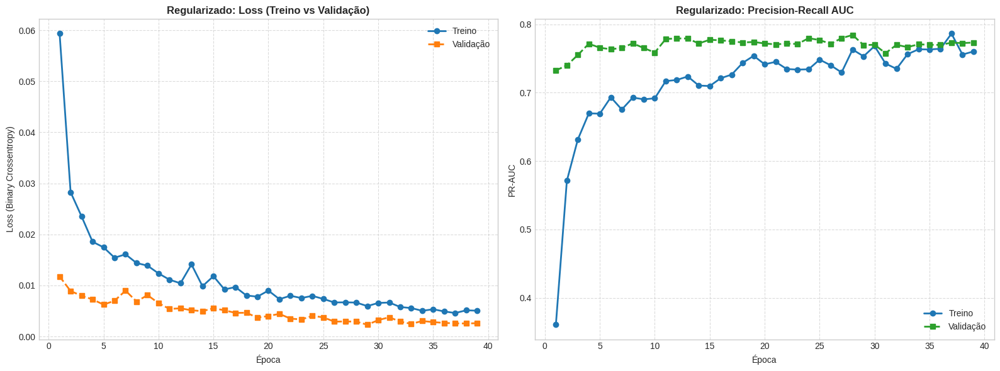

In [27]:
# TODO Executar plotagem do Modelo Regularizado passando o histórico e o prefixo do título dos gráficos
plot_learning_curves(history_reg, 'Regularizado')


## 🛠️ Etapa 4: Avaliação

1336/1336 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step
1336/1336 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step


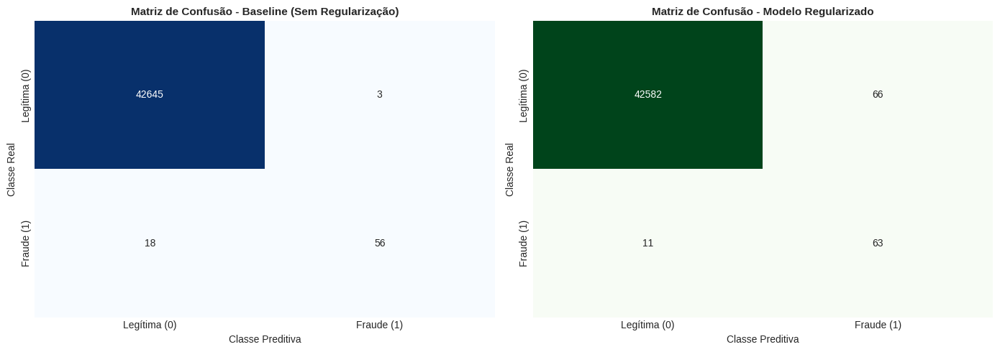

In [29]:
#TODO Faça as Predições no Conjunto de Teste para cada modelo predict().ravel()
x_test_pred_base = model_baseline.predict(X_test).ravel()
x_test_pred_reg = model_reg.predict(X_test).ravel()

y_test_pred_base = (x_test_pred_base >= 0.5).astype(int)
y_test_pred_reg = (x_test_pred_reg >= 0.5).astype(int)

# TODO Faça o Cálculo de Matrizes de Confusão de cada modelo
# usando confusion_matrix
cm_base = confusion_matrix(y_test, y_test_pred_base)
cm_reg = confusion_matrix(y_test, y_test_pred_reg)

# Visualização Comparativa da Matriz de Confusão
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(cm_base, annot=True, fmt='d', cmap='Blues', ax=axes[0], cbar=False)
axes[0].set_title("Matriz de Confusão - Baseline (Sem Regularização)", fontsize=11, fontweight='bold')
axes[0].set_xlabel("Classe Preditiva")
axes[0].set_ylabel("Classe Real")
axes[0].set_xticklabels(['Legítima (0)', 'Fraude (1)'])
axes[0].set_yticklabels(['Legítima (0)', 'Fraude (1)'])

sns.heatmap(cm_reg, annot=True, fmt='d', cmap='Greens', ax=axes[1], cbar=False)
axes[1].set_title("Matriz de Confusão - Modelo Regularizado", fontsize=11, fontweight='bold')
axes[1].set_xlabel("Classe Preditiva")
axes[1].set_ylabel("Classe Real")
axes[1].set_xticklabels(['Legítima (0)', 'Fraude (1)'])
axes[1].set_yticklabels(['Legítima (0)', 'Fraude (1)'])

plt.tight_layout()
plt.show()


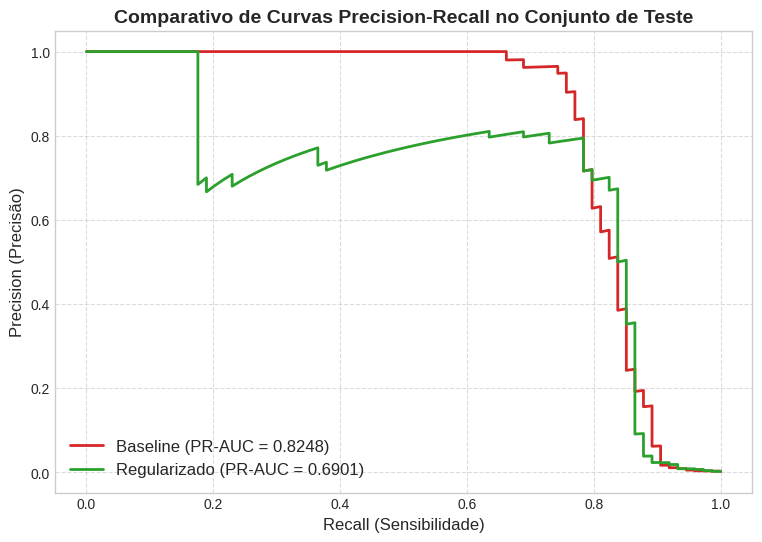

In [32]:
# Comparativo de Curvas Precision-Recall (PR-AUC)
# TODO gerar a curva precision recall usando precision_recall_curve e
# pegar o valor AUC usando a função auc
precision_base, recall_base, _ = precision_recall_curve(y_test, x_test_pred_base)
auc_base = auc(recall_base, precision_base)

precision_reg, recall_reg, _ = precision_recall_curve(y_test, x_test_pred_reg)
auc_reg = auc(recall_reg, precision_reg)

# Plotar a curva PR-AUC

plt.figure(figsize=(9, 6))
plt.plot(recall_base, precision_base, label=f'Baseline (PR-AUC = {auc_base:.4f})', color='#d62728', linewidth=2)
plt.plot(recall_reg, precision_reg, label=f'Regularizado (PR-AUC = {auc_reg:.4f})', color='#2ca02c', linewidth=2)

plt.xlabel('Recall (Sensibilidade)', fontsize=12)
plt.ylabel('Precision (Precisão)', fontsize=12)
plt.title('Comparativo de Curvas Precision-Recall no Conjunto de Teste', fontsize=14, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


As métricas tradicionais avaliam o desempenho do modelo, mas, no contexto de negócio, o objetivo é minimizar o impacto financeiro. Para isso, convertemos a matriz de confusão em uma função de custo, considerando que:


| Tipo de erro            | Impacto para o negócio                                                                                      | Exemplo de custos                                                                                                                                                                                 |
| ----------------------- | ----------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Falso Negativo (FN)** | Uma **fraude não detectada** é aprovada pelo modelo, <br> permitindo que a transação fraudulenta seja concluída. | Valor da transação perdida, **custos operacionais**, **chargebacks**, <br> taxas de terceiros, perda do produto/serviço, comprometimento <br> da confiança dos clientes e danos à reputação da instituição. |
| **Falso Positivo (FP)** | Uma **transação legítima** é incorretamente sinalizada <br> como fraude e bloqueada ou encaminhada para análise. | Custos de análise, revisão manual, eventual contato com o cliente, <br> atraso na aprovação da transação e possível inconveniência ou <br> insatisfação do cliente.                                         |


Referência: https://www.mastercard.com/mt/en/news-and-trends/insights/2025/what-s-the-true-cost-of-a-chargeback-in-2025.html

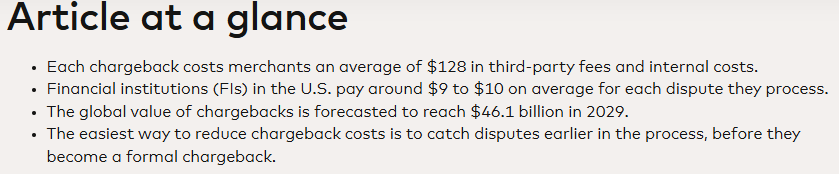

In [34]:
#@title Gerando a métrica de Negócio

COST_FN = 100
COST_FP = 1

thresholds = np.arange(0, 1.01, 0.05)

cost_base = []
cost_reg = []

for t in thresholds:
    # Baseline
      y_test,
        y_pred_proba_base >= t
    ).ravel()
    cost_base.append(COST_FN * fn + COST_FP * fp)

    # Regularizado
    tn, fp, fn, tp = confusion_matrix(
        y_test,
        y_pred_proba_reg >= t
    ).ravel()
    cost_reg.append(COST_FN * fn + COST_FP * fp)

plt.figure(figsize=(9,5))

plt.plot(thresholds, cost_base, label="Baseline")
plt.plot(thresholds, cost_reg, label="Regularizado")

cost_do_nothing = COST_FN * np.sum(y_test == 1)

plt.axhline(
    y=cost_do_nothing,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Não fazer nada (todas as fraudes passam)"
)

plt.text(
    0.05,            # posição X (extremo direito)
    cost_do_nothing - 500,     # um pouco abaixo da linha
    f"$ {cost_do_nothing:,.0f}",
    color="red",
    va="top"
)

plt.xlim(0,1)
plt.xlabel("Threshold")
plt.ylabel("Custo ($)")
plt.title("Custo de Negócio × Threshold")
plt.legend()

plt.show()

print(f"Baseline -> menor custo: ${min(cost_base):.2f} (threshold={thresholds[np.argmin(cost_base)]:.2f})")
print(f"Regularizado -> menor custo: ${min(cost_reg):.2f} (threshold={thresholds[np.argmin(cost_reg)]:.2f})tn, fp, fn, tp = confusion_matrix(
      ")

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 15)

# Conclusão

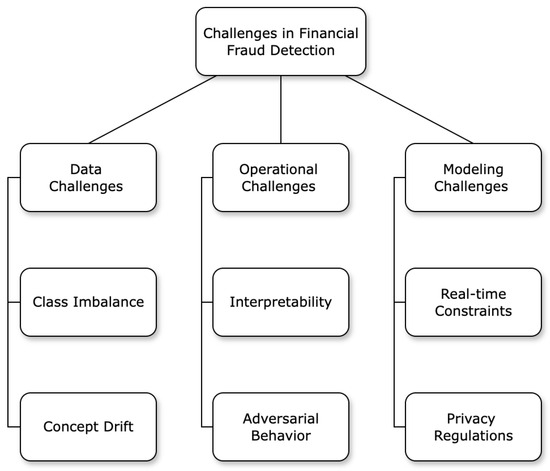

Um bom modelo é apenas parte da solução.

Sistemas reais de detecção de fraudes enfrentam desafios que vão além da modelagem.

- **Data Challenges:** lidar com classes desbalanceadas e com a constante mudança no comportamento das fraudes (concept drift).
- **Operational Challenges:** garantir interpretabilidade das decisões e acompanhar a evolução das estratégias dos fraudadores.
- **Modeling Challenges:** atender requisitos de baixa latência, escalabilidade e privacidade dos dados.

Por fim, é importante lembrar que, em aplicações reais, o objetivo não é apenas maximizar métricas como Accuracy ou F1-score, mas minimizar o impacto financeiro da fraude, equilibrando os custos de falsos positivos e falsos negativos. Em outras palavras, um sistema antifraude eficaz combina modelos preditivos, monitoramento contínuo e conhecimento do negócio para acompanhar a evolução constante das fraudes.

Referência: Thivaios, S., Kostopoulos, G., Stefani, A., & Kotsiantis, S. (2026). A Survey of Machine Learning and Deep Learning for Financial Fraud Detection: Architectures, Data Modalities, and Real-World Deployment Challenges. Algorithms, 19(5), 354. https://doi.org/10.3390/a19050354

---

## 📝 Sugestão de exploração

---

### 🧪 **Exploração 1: Impacto da Taxa de Dropout Extrema ($p = 0.7$)**
**Objetivo:** Alterar a taxa de Dropout de $0.3$ para $0.7$ e analisar o impacto na velocidade de convergência e na loss de validação.


### 🧪 **Exploração 2: Regularização $L_2$ (Weight Decay)**
**Objetivo:** Substituir o Dropout por regularização $L_2$ (`kernel_regularizer=tf.keras.regularizers.l2(0.01)`) nas camadas densas e comparar com o modelo focado em Dropout.


### 🧪 **Exploração 3: Reamostragem Tecnológica — SMOTE (Over-sampling) vs. Random Undersampling**
**Objetivo:** Aplicar **SMOTE** (sobreamostragem da classe fraudulenta) e **RandomUndersampling** (subamostragem da classe legítima) no conjunto de treino, treinar a rede neural sem `class_weight` e comparar o desempenho do PR-AUC e Matriz de Confusão no teste.
